In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as pd
import pandas as pd
import cv2
import pydicom
import scipy

from sklearn.model_selection import train_test_split, StratifiedKFold
from matplotlib import pyplot as plt
from utils.mask_functions import *
from glob import glob
from PIL import Image
from scipy.sparse import load_npz
from keras_tqdm import TQDMNotebookCallback
from tqdm import tqdm_notebook

import tensorflow as tf
import keras
from keras.applications.resnet50 import ResNet50
from keras_applications.resnext import ResNeXt50
from keras.utils import Sequence
from keras.preprocessing.image import load_img
from keras.models import Model, model_from_json
from keras.layers import Input, ReLU, LeakyReLU, core, Dropout, BatchNormalization, Concatenate, Dense, Flatten, GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras import backend as K
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.losses import binary_crossentropy
from keras.optimizers import SGD, Adam
from keras.preprocessing.image import ImageDataGenerator

Using TensorFlow backend.


In [2]:
# Restrict to single GPU
os.environ["CUDA_VISIBLE_DEVICES"]='3'

In [3]:
train_path = './siim/dicom-images-train/*/*/*.dcm'
mask_path = './siim/train-rle.csv'
images_to_ram = True # Low or high memory usage
mask_img = True # Load masks?
img_height = 512
img_width = 512
n_channels = 3
batch_size = 8
epochs = 500

In [4]:
def get_train_df(train_path=train_path, mask_path=mask_path, images_to_ram=False, mask_img=False):
    rles_df = pd.read_csv(mask_path)
    rles_df.columns = ['ImageId', 'EncodedPixels']
        
    metadata_list = []
    train_fps = glob(train_path)

    if images_to_ram is True:
        img_dict = {}
    for i, fp in tqdm_notebook(enumerate(train_fps)):
        metadata = {}
        dcm = pydicom.dcmread(fp)
        metadata['ImageId'] = dcm.SOPInstanceUID
        metadata['FilePath'] = fp
        
        encoded_pixels_list = rles_df[rles_df['ImageId']==dcm.SOPInstanceUID]['EncodedPixels'].values
        pneumothorax = False
        for encoded_pixels in encoded_pixels_list:
            if encoded_pixels != ' -1':
                pneumothorax = True
        
        metadata['Pneumothorax'] = pneumothorax
        
        if images_to_ram is True:
            metadata['PixelArray'] = dcm.pixel_array
            if mask_img is True:
                if pneumothorax is True:
                    metadata['EncodedPixels'] = load_npz('siim/mask/'+dcm.SOPInstanceUID+'.npz').todense().astype('uint8')
                else:
                    metadata['EncodedPixels'] = np.zeros((1024, 1024))
                
        metadata_list.append(metadata)

    return pd.DataFrame(metadata_list)

In [5]:
df = get_train_df(train_path, mask_path, images_to_ram, mask_img)

In [6]:
df.head()

,ImageId,FilePath,Pneumothorax,PixelArray,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.31935.15178751...,./siim/dicom-images-train/1.2.276.0.7230010.3....,False,"[[1, 2, 3, 3, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,1.2.276.0.7230010.3.1.4.8323329.4297.151787518...,./siim/dicom-images-train/1.2.276.0.7230010.3....,True,"[[1, 0, 1, 0, 0, 3, 0, 0, 2, 1, 1, 0, 0, 0, 0,...","[[[[[0 0 0 ... 0 0 0]]]], [[[[0 0 0 ... 0 0 0]..."
2,1.2.276.0.7230010.3.1.4.8323329.12953.15178752...,./siim/dicom-images-train/1.2.276.0.7230010.3....,False,"[[0, 1, 2, 3, 3, 2, 3, 3, 2, 2, 2, 2, 2, 2, 2,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,1.2.276.0.7230010.3.1.4.8323329.12901.15178752...,./siim/dicom-images-train/1.2.276.0.7230010.3....,False,"[[86, 87, 88, 88, 88, 88, 87, 86, 86, 86, 86, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,1.2.276.0.7230010.3.1.4.8323329.12036.15178752...,./siim/dicom-images-train/1.2.276.0.7230010.3....,False,"[[153, 139, 123, 107, 94, 84, 75, 65, 57, 52, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [7]:
# Split data
train_df, val_df = train_test_split(df, stratify=df.Pneumothorax, test_size=0.2, random_state=88)

In [8]:
train_df[train_df['Pneumothorax']==True].head()

,ImageId,FilePath,Pneumothorax,PixelArray,EncodedPixels
4409,1.2.276.0.7230010.3.1.4.8323329.11943.15178752...,./siim/dicom-images-train/1.2.276.0.7230010.3....,True,"[[183, 181, 180, 178, 177, 177, 176, 176, 172,...","[[[[[0 0 0 ... 0 0 0]]]], [[[[0 0 0 ... 0 0 0]..."
1999,1.2.276.0.7230010.3.1.4.8323329.4759.151787518...,./siim/dicom-images-train/1.2.276.0.7230010.3....,True,"[[0, 2, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 6, 6, 6,...","[[[[[0 0 0 ... 0 0 0]]]], [[[[0 0 0 ... 0 0 0]..."
2273,1.2.276.0.7230010.3.1.4.8323329.11262.15178752...,./siim/dicom-images-train/1.2.276.0.7230010.3....,True,"[[1, 0, 0, 2, 0, 3, 0, 0, 0, 0, 0, 1, 1, 0, 0,...","[[[[[0 0 0 ... 0 0 0]]]], [[[[0 0 0 ... 0 0 0]..."
871,1.2.276.0.7230010.3.1.4.8323329.5575.151787518...,./siim/dicom-images-train/1.2.276.0.7230010.3....,True,"[[5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4,...","[[[[[0 0 0 ... 0 0 0]]]], [[[[0 0 0 ... 0 0 0]..."
637,1.2.276.0.7230010.3.1.4.8323329.10965.15178752...,./siim/dicom-images-train/1.2.276.0.7230010.3....,True,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[[[[[0 0 0 ... 0 0 0]]]], [[[[0 0 0 ... 0 0 0]..."


In [9]:
# Adjust gamma

def adjust_gamma(image, gamma = 1.5):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                     for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

In [47]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, data_frame,
                 batch_size=4,
                 img_height=512,
                 img_width=512,
                 n_channels=3,
                 augmentations=None,
                 shuffle=True,
                 mask_img=False):
        self.data_frame = data_frame
        self.batch_size = batch_size
        self.img_height = img_height
        self.img_width = img_width
        self.n_channels = n_channels
        self.augment = augmentations
        self.shuffle = shuffle
        self.mask_img = mask_img
        self.on_epoch_end()
        
    def __len__(self):
        'Batches per epoch'
        return int(np.ceil(len(self.data_frame) / self.batch_size))
    
    def on_epoch_end(self):
        'Update indexes when epoch ends'
        self.indexes = np.arange(len(self.data_frame))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
    
    def __getitem__(self, index):
        'Get one batch'
        batch_indexes = self.indexes[index*self.batch_size:min((index+1)*self.batch_size,len(self.data_frame))]
        
        batch_x, batch_y = self.data_generation(batch_indexes)
        
        if self.augment is None:
            if self.mask_img is False:
                return np.array(batch_x)/255, np.array(batch_y)
            else:
                return np.array(batch_x)/255, np.array(batch_y), np.array(self.get_masks(batch_indexes))
        else:
            if self.mask_img is False:
                return np.stack([self.augment(image=x)['image'] for x in batch_x], axis=0), np.array(batch_y)
            else:
                return np.stack([self.augment(image=x)['image'] for x in batch_x], axis=0), np.array(batch_y), np.array(self.get_masks(batch_indexes))
        
    def data_generation(self, batch_indexes):
        if 'PixelArray' in self.data_frame.columns:
            X = [cv2.resize(img, (self.img_height, self.img_width)) for img in self.data_frame.iloc[batch_indexes]['PixelArray']]
#             if self.augment == AUGMENTATIONS_TEST:
#                 X = np.stack([adjust_gamma(img, gamma=1.2) for img in X], axis=0)
        else:   
            fps = self.data_frame.iloc[batch_indexes].FilePath
            X = np.empty((len(fps), self.img_height, self.img_width))
            for i, fp in enumerate(fps):
                dcm = pydicom.dcmread(fp)
                X[i] = cv2.resize(dcm.pixel_array, (self.img_height, self.img_width))
        # Gray img to rgb
        X = np.stack([X, X, X], axis=3)

        Y = pd.concat([np.invert(self.data_frame.iloc[batch_indexes]['Pneumothorax'])+0,
                      self.data_frame.iloc[batch_indexes]['Pneumothorax']+0],
                      axis=1)
        
        return np.uint8(X), np.uint8(Y)
    
    def get_masks(self, batch_indexes):
        masks = [cv2.resize(img, (self.img_height, self.img_width)) for img in self.data_frame.iloc[batch_indexes]['EncodedPixels']]
        
        return np.uint8(masks)

In [48]:
from albumentations import (
    Compose, HorizontalFlip, CLAHE, HueSaturationValue,
    RandomBrightness, RandomContrast, RandomGamma,OneOf,
    ToFloat, ShiftScaleRotate, GridDistortion, ElasticTransform, JpegCompression, HueSaturationValue,
    RGBShift, RandomBrightness, RandomContrast, GaussNoise, CenterCrop,
    IAAAdditiveGaussianNoise, GaussNoise, RandomSizedCrop, Normalize
)
from albumentations import Lambda as Lamb

AUGMENTATIONS_TRAIN = Compose([
    HorizontalFlip(p=0.5),
    RandomBrightness(p=0.5),
    ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.1,
        rotate_limit=5,
        border_mode=cv2.BORDER_CONSTANT,
        p=0.5
    ),
    RandomSizedCrop(min_max_height=(int(0.95*img_height), img_height), height=img_height, width=img_width, p=0.5),
    CLAHE(),
    ToFloat()
], p=1)


AUGMENTATIONS_TEST = Compose([
    CLAHE(),
    ToFloat()
], p=1)

# Add Gamma correction to test
#from imgaug import augmenters as iaa
#seq = iaa.Sequential([iaa.GammaContrast(1.2)])

In [49]:
def plot_pixel_array(data, figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.imshow(data, cmap=plt.cm.bone)
    plt.show()
    
def plot_pixel_array_overlay(data, label, figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.imshow(data, cmap=plt.cm.bone)
    plt.imshow(label, alpha=.3)
    plt.show()
    
def plot_grid(imgs, grid_width, grid_height):
    max_imgs = grid_width*grid_height
    plt.clf()
    fig, axes = plt.subplots(grid_height, grid_width, figsize=(16, 12))
    
    for i, img in zip(range(max_imgs), imgs):
        ax = axes[int(i/grid_width), i%grid_width]
        ax.imshow(img, cmap='bone')
        ax.axis('off')
    
    plt.show()
    
def plot_grid_overlay(imgs, masks, grid_width, grid_height):
    max_imgs = grid_width*grid_height
    plt.clf()
    fig, axes = plt.subplots(grid_height, grid_width, figsize=(grid_width*20, grid_height*20))
    
    for i, img, mask in zip(range(max_imgs), imgs, masks):
        ax = axes[int(i/grid_width), i%grid_width]
        ax.imshow(img, cmap='bone')
        ax.imshow(mask, alpha=.3)
        ax.axis('off')
    
    plt.show()

In [50]:
a = DataGenerator(data_frame=train_df[train_df['Pneumothorax']==True], batch_size=10, shuffle=False,
                 img_height=img_height, img_width=img_width, n_channels=n_channels, mask_img=True)
b = DataGenerator(data_frame=train_df[train_df['Pneumothorax']==True], batch_size=10, shuffle=False,
                 img_height=img_height, img_width=img_width, n_channels=n_channels, mask_img=True, augmentations=AUGMENTATIONS_TEST)
imgs_a, y_a, masks_a = a.__getitem__(0)
imgs_b, y_b, masks_b = b.__getitem__(0)

<Figure size 432x288 with 0 Axes>

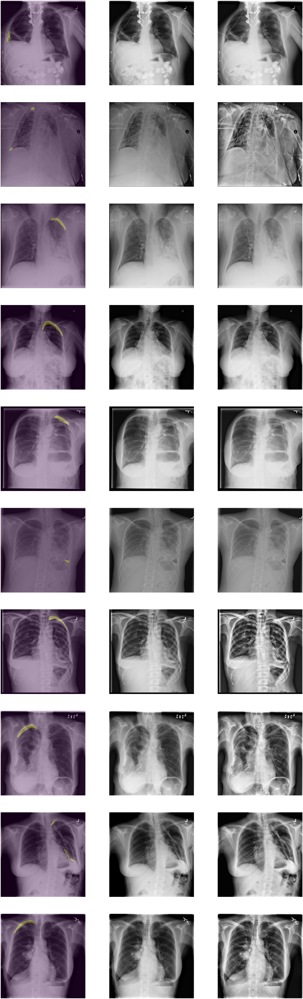

In [51]:
grid_height = 10
grid_width = 3
max_imgs = grid_width*grid_height
plt.clf()
fig, axes = plt.subplots(grid_height, grid_width, figsize=(grid_width*18, grid_height*18))
#print(max_imgs, imgs_a.shape, masks_a.shape, imgs_b.shape, masks_b.shape)

for i, img_a, mask_a, img_b, mask_b in zip(range(int(max_imgs/2)), imgs_a, masks_a, imgs_b, masks_b):
    ax_a = axes[i, 0]
    ax_b = axes[i, 1]
    ax_c = axes[i, 2]
    
    ax_a.imshow(img_a, cmap='bone')
    ax_a.imshow(mask_a, alpha=.3)
    ax_a.axis('off')
    
    ax_b.imshow(img_a, cmap='bone')
    ax_b.axis('off')
    
    ax_c.imshow(img_b, cmap='bone')
    ax_c.axis('off')
    
plt.show()

#plot_grid_overlay(imgs[:,:,:,0], masks, 2, 10)
#imgs[0].min(), imgs[0].max(), imgs.shape, imgs[0].shape, masks.shape

#  Conclusions

Gamma improves bad images but also deteriorates good ones. It's a mixed bag so I'll avoid using it for now.
Clahe consistently improves our images.
Random brightness should not have the potential to change the classification (unlike elastic transform, random contrast, and random gamma), so I've included it.